In [377]:
import numpy as np 
import pandas as pd 
import scipy.io
import matplotlib.pyplot as plt
import seaborn as sns
import os
from scipy import signal
from scipy.fft import fft, fftshift
from mne import create_info, EpochsArray
from mne.preprocessing import ICA
from sklearn.svm import SVC
from sklearn import preprocessing
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from torchmetrics import Accuracy
from sklearn.preprocessing import OneHotEncoder

import warnings
from scipy.signal import butter, iirnotch, filtfilt
warnings.filterwarnings("ignore")

## 1. Data processing

In [378]:
folder_path = r"C:\Users\Daniel\OneDrive - VNU-HCMUS\Desktop\Pattern-Recognition\data\EEG Data"
file_paths = []

for dirname, _, filenames in os.walk(folder_path):
    for filename in filenames:
        file_paths.append(os.path.join(dirname, filename))

file_paths

['C:\\Users\\Daniel\\OneDrive - VNU-HCMUS\\Desktop\\Pattern-Recognition\\data\\EEG Data\\eeg_record1.mat',
 'C:\\Users\\Daniel\\OneDrive - VNU-HCMUS\\Desktop\\Pattern-Recognition\\data\\EEG Data\\eeg_record10.mat',
 'C:\\Users\\Daniel\\OneDrive - VNU-HCMUS\\Desktop\\Pattern-Recognition\\data\\EEG Data\\eeg_record11.mat',
 'C:\\Users\\Daniel\\OneDrive - VNU-HCMUS\\Desktop\\Pattern-Recognition\\data\\EEG Data\\eeg_record12.mat',
 'C:\\Users\\Daniel\\OneDrive - VNU-HCMUS\\Desktop\\Pattern-Recognition\\data\\EEG Data\\eeg_record13.mat',
 'C:\\Users\\Daniel\\OneDrive - VNU-HCMUS\\Desktop\\Pattern-Recognition\\data\\EEG Data\\eeg_record14.mat',
 'C:\\Users\\Daniel\\OneDrive - VNU-HCMUS\\Desktop\\Pattern-Recognition\\data\\EEG Data\\eeg_record15.mat',
 'C:\\Users\\Daniel\\OneDrive - VNU-HCMUS\\Desktop\\Pattern-Recognition\\data\\EEG Data\\eeg_record16.mat',
 'C:\\Users\\Daniel\\OneDrive - VNU-HCMUS\\Desktop\\Pattern-Recognition\\data\\EEG Data\\eeg_record17.mat',
 'C:\\Users\\Daniel\\OneDrive

In [379]:
mat = scipy.io.loadmat(file_paths[1])
data = mat['o']['data'][0,0]

column_names = [
    'AF3', 'F7', 'F3', 'FC5','T7', 'P7', 'O1', 'O2', 
    'P8', 'T8', 'FC6', 'F4', 'F8', 'AF4'
]
data_1 = pd.DataFrame(data[:, 3:17], columns=column_names)

In [380]:
data_1.head()

,AF3,F7,F3,FC5,T7,P7,O1,O2,P8,T8,FC6,F4,F8,AF4
0,4435.897436,4027.692308,5087.179487,3826.666667,4035.384615,4404.102564,4366.666667,4125.641026,4217.435897,4308.205128,4142.564103,4283.589744,4334.871795,4158.974359
1,4437.948718,4028.717949,5085.128205,3818.974359,4035.897436,4404.615385,4368.717949,4125.128205,4218.974359,4308.717949,4140.512821,4283.589744,4334.871795,4151.794872
2,4440.512821,4034.871795,5090.256410,3815.384615,4035.384615,4413.846154,4369.743590,4136.923077,4227.179487,4308.717949,4142.564103,4283.589744,4333.846154,4156.923077
3,4441.538462,4028.717949,5088.205128,3820.512821,4034.871795,4405.641026,4367.179487,4131.794872,4220.000000,4308.205128,4143.076923,4283.589744,4334.871795,4155.384615
4,4440.000000,4019.487179,5077.435897,3825.641026,4036.923077,4391.794872,4365.641026,4117.948718,4212.307692,4308.205128,4137.435897,4283.589744,4335.384615,4147.179487


In [381]:
data_1.describe()

,AF3,F7,F3,FC5,T7,P7,O1,O2,P8,T8,FC6,F4,F8,AF4
count,381340.000000,381340.000000,381340.000000,381340.000000,381340.000000,381340.000000,381340.000000,381340.000000,381340.000000,381340.000000,381340.000000,381340.000000,381340.000000,381340.000000
mean,4437.942689,3976.320869,5036.932052,3827.578020,4036.169908,4319.363841,4283.604987,4038.147469,4156.484190,4307.630111,4141.772503,4282.644245,4334.661536,4129.875856
std,2.176525,40.235420,65.638406,2.528549,1.732753,49.621416,67.034060,56.594214,49.979765,2.085118,4.708368,1.130543,1.197543,55.710492
min,4389.230769,3731.282051,4633.846154,3795.384615,4016.410256,3985.641026,3909.743590,3671.794872,3846.153846,4294.358974,3954.358974,4261.538462,4311.282051,3735.897436
25%,4436.410256,3959.487179,5016.923077,3826.153846,4034.871795,4298.461538,4255.897436,4015.384615,4133.846154,4307.179487,4140.512821,4282.051282,4334.358974,4108.717949
50%,4437.948718,3977.435897,5042.051282,3827.692308,4035.897436,4326.153846,4281.538462,4040.512821,4154.358974,4308.205128,4141.538462,4282.564103,4334.871795,4136.410256
75%,4439.487179,3996.923077,5067.179487,3829.230769,4036.923077,4346.666667,4310.769231,4062.564103,4176.410256,4308.205128,4143.076923,4283.076923,4335.384615,4156.410256
max,4490.769231,4280.512821,5943.076923,3838.461538,4053.333333,4586.666667,4695.897436,4386.153846,4475.384615,4342.051282,4372.820513,4304.615385,4350.769231,5043.589744


In [382]:
def plot_column_distributions(df, bins=30, figsize=(12, 8)):
    numeric_columns = df.select_dtypes(include=['number']).columns  
    n_cols = 3  
    n_rows = (len(numeric_columns) + n_cols - 1) // n_cols  

    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize, constrained_layout=True)
    axes = axes.flatten() 
    
    for idx, col in enumerate(numeric_columns):
        sns.histplot(df[col].dropna(), kde=True, bins=bins, ax=axes[idx], color='skyblue')
        axes[idx].set_title(f"Distribution of '{col}'", fontsize=12)
        axes[idx].set_xlabel("Amplitude")
        axes[idx].set_ylabel("Frequency")

    # Ẩn các ô không sử dụng (nếu số cột không chia hết cho n_cols)
    for idx in range(len(numeric_columns), len(axes)):
        axes[idx].axis('off')

    plt.suptitle("Distributions of Numeric Columns", fontsize=16, y=1.02)
    plt.show()


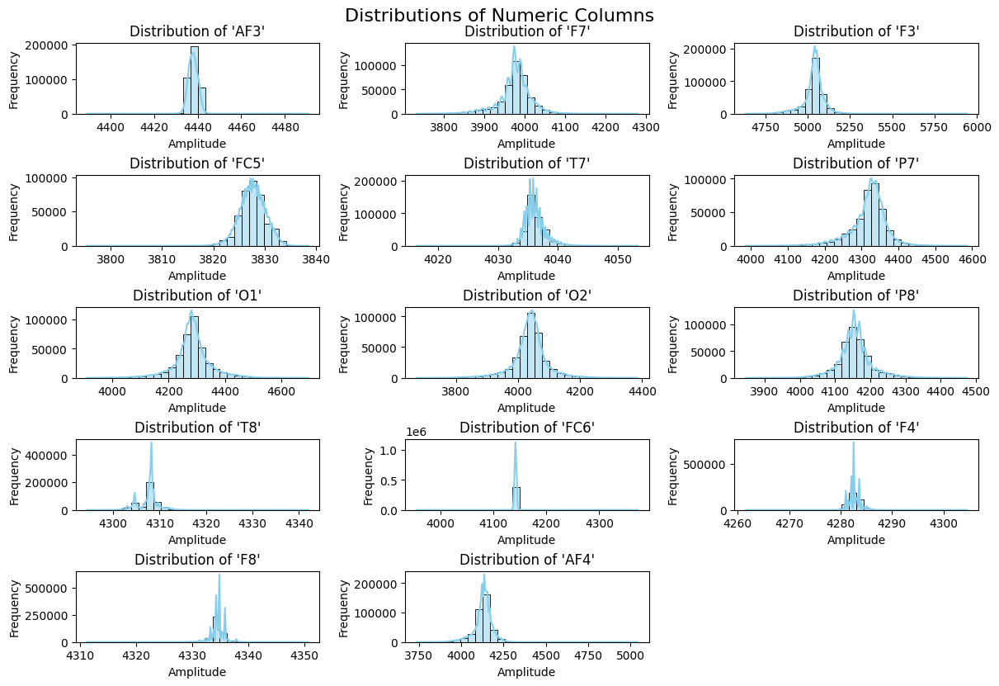

In [383]:
plot_column_distributions(data_1)

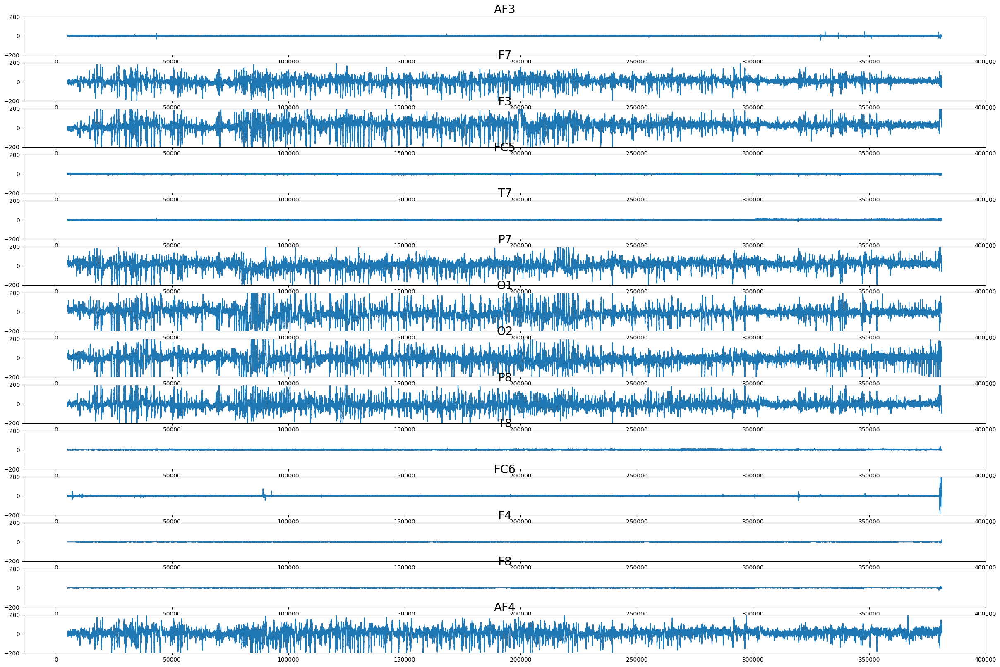

In [384]:
fig, ax = plt.subplots(14,1)
fig.set_figwidth(20)
fig.set_figheight(50)
fig.set_size_inches(30, 20)
for i in range(14):
    data_ave = data_1.iloc[5000:500000, i] - np.mean(data_1.iloc[5000:50000, i])
    ax[i].plot(data_ave)
    ax[i].set_title(data_1.columns[i], fontsize=20)
    ax[i].set_ylim(-200, 200)

Ta nhận thấy dữ liệu của 7 kênh: F7, F3, P7, O1, O2, P8, AF4 có variance rộng và có sự phân tán nên biên độ giao động sẽ có ảnh hưởng nhiều hơn so với những kênh còn lại. Mà theo như bài báo của tác giả có đề cập: "The acquired data from the 7 leads were identified by F3, F4, Fz, C3, C4, Cz, and Pz.". Hay 7 kênh mà tác giả muốn đề cập là F7, F3, P7, O1, O2, P8, AF4. Vậy nên ta sẽ chọn 7 kênh này và bỏ dữ liệu từ 7 kênh còn lại.

In [385]:
def load_subject_data(folder_path, subjects, useful_channels):
    all_subject_data = {}  # Dictionary để lưu dữ liệu toàn bộ các đối tượng

    for subject_name, trials in subjects.items():
        subject_data = {}  # Dictionary lưu dữ liệu từng lần thí nghiệm của đối tượng
        for trial_name, file_name in trials.items():
            file_path = os.path.join(folder_path, file_name + '.mat')
            if os.path.exists(file_path):  # Kiểm tra file có tồn tại
                mat = scipy.io.loadmat(file_path)
                data = mat['o']['data'][0, 0]
                
                # Trích xuất dữ liệu các kênh cần thiết
                subject_data[trial_name] = data[:, useful_channels].copy()
            else:
                print(f"File {file_name} không tồn tại.")
        
        # Lưu dữ liệu của đối tượng vào dictionary chính
        all_subject_data[subject_name] = subject_data

    return all_subject_data

def create_subject_objects(*subjects):
    all_subjects = {}
    for i, files in enumerate(subjects, start=1):
        subject_data = {}
        for day, file_name in files.items():
            subject_data[day] = file_name
        all_subjects[f"Subject_{i}"] = subject_data
    return all_subjects


# Dữ liệu của các đối tượng
subj1_files = {'Day_1': 'eeg_record3', 'Day_2': 'eeg_record4', 'Day_3': 'eeg_record5', 
               'Day_4': 'eeg_record6', 'Day_5': 'eeg_record7'}
subj2_files = {'Day_1': 'eeg_record10', 'Day_2': 'eeg_record11', 'Day_3': 'eeg_record12', 
               'Day_4': 'eeg_record13', 'Day_5': 'eeg_record14'}
subj3_files = {'Day_1': 'eeg_record17', 'Day_2': 'eeg_record18', 'Day_3': 'eeg_record19', 
               'Day_4': 'eeg_record20', 'Day_5': 'eeg_record21'}
subj4_files = {'Day_1': 'eeg_record24', 'Day_2': 'eeg_record25', 'Day_3': 'eeg_record26', 
               'Day_4': 'eeg_record27', 'Day_5': 'eeg_record28'}
subj5_files = {'Day_1': 'eeg_record31', 'Day_2': 'eeg_record32', 'Day_3': 'eeg_record33', 
               'Day_4': 'eeg_record34'}

# Tạo các đối tượng
subjects = create_subject_objects(subj1_files, subj2_files, subj3_files, subj4_files, subj5_files)

# Danh sách các kênh cần trích xuất
useful_channels = np.array([1, 2, 5, 6, 7, 8, 13]) + 3

# Gọi hàm load dữ liệu
all_subject_data = load_subject_data(folder_path, subjects, useful_channels)

# Kiểm tra dữ liệu
for subject, trials in all_subject_data.items():
    print(f"{subject}:")
    for trial, data in trials.items():
        print(f"  {trial}: {data.shape}")


Subject_1:
  Day_1: (357224, 7)
  Day_2: (380344, 7)
  Day_3: (351204, 7)
  Day_4: (288752, 7)
  Day_5: (398816, 7)
Subject_2:
  Day_1: (381340, 7)
  Day_2: (391624, 7)
  Day_3: (356728, 7)
  Day_4: (373304, 7)
  Day_5: (345164, 7)
Subject_3:
  Day_1: (443972, 7)
  Day_2: (361840, 7)
  Day_3: (333236, 7)
  Day_4: (396812, 7)
  Day_5: (336280, 7)
Subject_4:
  Day_1: (360928, 7)
  Day_2: (415164, 7)
  Day_3: (363232, 7)
  Day_4: (347548, 7)
  Day_5: (214540, 7)
Subject_5:
  Day_1: (428848, 7)
  Day_2: (483732, 7)
  Day_3: (483376, 7)
  Day_4: (408976, 7)


In [386]:
all_subject_data['Subject_1']['Day_1'].shape

(357224, 7)

Môi tập dữ liệu là một bản ghi lại tín hiệu sóng não thông qua quá trình thử nghiệm lái tàu mô phỏng trên máy tính có tên là "Microsoft Train Simulator". Với 5 người tham gia, mỗi file sẽ kéo dài trong khoảng 35-55 phút, mỗi người chơi thực hiện 7 lần thử nghiệm.

Trong 10 phút đầu người chơi duy trì trạng thái tập trung, ở 10 phút tiếp theo thì người chơi sẽ vào trạng thái không tập trung, và thời gian còn lại sẽ rơi vào trạng thái buồn ngủ.

Trong bản ghi tác giả có nói 2 bản ghi đầu của mỗi đối tượng sẽ để làm quen nên ta sẽ chỉ lấy 5 bản ghi cuối cùng của mỗi người tham gia, và người thứ 5 sẽ không được ghi lại ở bản ghi thứ 7

Dựa vào những cung cấp trên của bài báo thì ta có thể chia dữ liệu thành 10 phút đầu là trạng thái tập trung(focus), 10 phút tiếp theo là trạng thái không tập trung(unfocus) và thời gian còn lại là trạng thái buông ngủ(drowsy) nhưng do ta cần cân bằng về mặt label cho việc dự đoán nên ta sẽ chọn mốc thời gian cuối dùng là từ phút 20 đến phút 30.

Ta cần kiểm tra xem dữ liệu trong từng ngày kiểm tra có đủ tối thiểu 30 phút hay không

In [387]:

def check_days_with_insufficient_time(subject_data, freq_sample=128, min_time=30):
    result = {}
    
    for subject, days in subject_data.items():
        insufficient_days = []  
        for day, data in days.items():
            samples = data.shape[0]  
            time_in_minutes = samples / (freq_sample * 60)  
            
            # Kiểm tra nếu không đủ thời gian
            if time_in_minutes < min_time:
                insufficient_days.append((day, time_in_minutes))  
        
        if insufficient_days:
            result[subject] = insufficient_days  
    return result


def drop_insufficient_days(subject_data, insufficient_days_result):
    updated_data = {}

    for subject, days in subject_data.items():
        # Lấy danh sách các ngày không đủ thời gian cho subject này
        insufficient_days = [day for day, _ in insufficient_days_result.get(subject, [])]
        
        # Lấy các ngày hợp lệ (không có trong insufficient_days)
        valid_days = {day: data for day, data in days.items() if day not in insufficient_days}
        
        # Cập nhật subject mới với các ngày hợp lệ
        updated_data[subject] = valid_days
    
    return updated_data

In [388]:

result = check_days_with_insufficient_time(all_subject_data)
print(result)

{'Subject_4': [('Day_5', 27.934895833333332)]}


In [389]:
all_subject_data = drop_insufficient_days(all_subject_data, result)

In [390]:
# Kiểm tra dữ liệu
for subject, trials in all_subject_data.items():
    print(f"{subject}:")
    for trial, data in trials.items():
        print(f"  {trial}: {data.shape}")

Subject_1:
  Day_1: (357224, 7)
  Day_2: (380344, 7)
  Day_3: (351204, 7)
  Day_4: (288752, 7)
  Day_5: (398816, 7)
Subject_2:
  Day_1: (381340, 7)
  Day_2: (391624, 7)
  Day_3: (356728, 7)
  Day_4: (373304, 7)
  Day_5: (345164, 7)
Subject_3:
  Day_1: (443972, 7)
  Day_2: (361840, 7)
  Day_3: (333236, 7)
  Day_4: (396812, 7)
  Day_5: (336280, 7)
Subject_4:
  Day_1: (360928, 7)
  Day_2: (415164, 7)
  Day_3: (363232, 7)
  Day_4: (347548, 7)
Subject_5:
  Day_1: (428848, 7)
  Day_2: (483732, 7)
  Day_3: (483376, 7)
  Day_4: (408976, 7)


In [391]:
import numpy as np
from scipy.signal import butter, filtfilt, iirnotch

def combined_filter(data, fs=128):
    """
    Áp dụng bộ lọc band-pass từ 0.5Hz đến 40Hz và bộ lọc Notch tại 50Hz.
    
    Parameters:
        data (ndarray): Dữ liệu EEG cần lọc.
        fs (int): Tần số lấy mẫu (Hz), mặc định là 128.
    
    Returns:
        ndarray: Dữ liệu đã được lọc.
    """
    nyquist = fs / 2
    low = 0.5 / nyquist
    high = 40 / nyquist
    b_band, a_band = butter(6, [low, high], btype='band')
    
    # Thiết kế bộ lọc Notch tại 50Hz
    notch_freq = 50  # tần số nguồn điện
    quality_factor = 10  # độ rộng của bộ lọc
    b_notch, a_notch = iirnotch(notch_freq, quality_factor, fs)
    
    # Áp dụng bộ lọc band-pass
    bandpass_filtered = filtfilt(b_band, a_band, data)
    
    # Áp dụng bộ lọc Notch
    filtered_signal = filtfilt(b_notch, a_notch, bandpass_filtered)
    
    return filtered_signal

def filter_subject_data(subject_data, fs=128):
    """
    Lọc dữ liệu cho tất cả các đối tượng và các ngày thí nghiệm.

    Parameters:
        subject_data (dict): Dữ liệu của các đối tượng và các lần thí nghiệm.
        fs (int): Tần số lấy mẫu (Hz), mặc định là 128.

    Returns:
        dict: Dữ liệu đã lọc cho các đối tượng.
    """
    filtered_data = {}

    # Duyệt qua tất cả các đối tượng
    for subject_name, trials in subject_data.items():
        subject_filtered = {}
        
        # Duyệt qua các ngày thí nghiệm của đối tượng
        for trial_name, data in trials.items():
            # Lọc dữ liệu của từng ngày thí nghiệm
            subject_filtered[trial_name] = np.apply_along_axis(combined_filter, axis=0, arr=data, fs=fs)
        
        # Lưu dữ liệu đã lọc của đối tượng
        filtered_data[subject_name] = subject_filtered

    return filtered_data

# Áp dụng lọc dữ liệu cho các đối tượng
filtered_all_subject_data = filter_subject_data(all_subject_data, fs=128)

In [392]:
channel_names = [
    'F7', 'F3', 'P7', 'O1', 'O2', 'P8', 'AF4'
]

In [393]:
def analyze_data(all_subject_data, filtered_all_subject_data, num_subjects=2, num_days=1, fs=128):
    """
    Vẽ biểu đồ tín hiệu EEG trước và sau khi lọc cho các đối tượng trong từng ngày thí nghiệm.
    
    Parameters:
    - all_subject_data: Dữ liệu thô của tất cả các đối tượng
    - filtered_all_subject_data: Dữ liệu đã lọc của tất cả các đối tượng
    - num_subjects: Số lượng đối tượng cần phân tích (mặc định là 2)
    - num_days: Số lượng ngày thí nghiệm cần phân tích (mặc định là 1)
    - fs: Tần số lấy mẫu
    """
    subjects = list(all_subject_data.keys())[:num_subjects]  # Lấy một số đối tượng cần phân tích
    
    for subject in subjects:
        subject_data = all_subject_data[subject]
        subject_filtered_data = filtered_all_subject_data[subject]
        
        # Duyệt qua các ngày thí nghiệm
        days = list(subject_data.keys())[:num_days]  # Lấy số ngày cần phân tích
        for day in days:
            raw_data = subject_data[day]
            filtered_data = subject_filtered_data[day]

            # Vẽ biểu đồ tín hiệu gốc
            plt.figure(figsize=(15, 10))
            plt.subplot(2, 1, 1)
            plt.plot(raw_data[1000:2000, :])  # Vẽ 500 mẫu đầu tiên của dữ liệu
            plt.title(f"Raw EEG Data - {subject} - {day}")
            plt.xlabel("Sample")
            plt.ylabel("Amplitude")
            plt.legend(channel_names)
            plt.grid(True)

            # Vẽ biểu đồ tín hiệu đã lọc
            plt.subplot(2, 1, 2)
            plt.plot(filtered_data[1000:2000, :])  # Vẽ 500 mẫu đầu tiên của dữ liệu đã lọc
            plt.title(f"Filtered EEG Data - {subject} - {day}")
            plt.xlabel("Sample")
            plt.ylabel("Amplitude")
            plt.legend(channel_names)
            plt.grid(True)

            plt.tight_layout()
            plt.show()



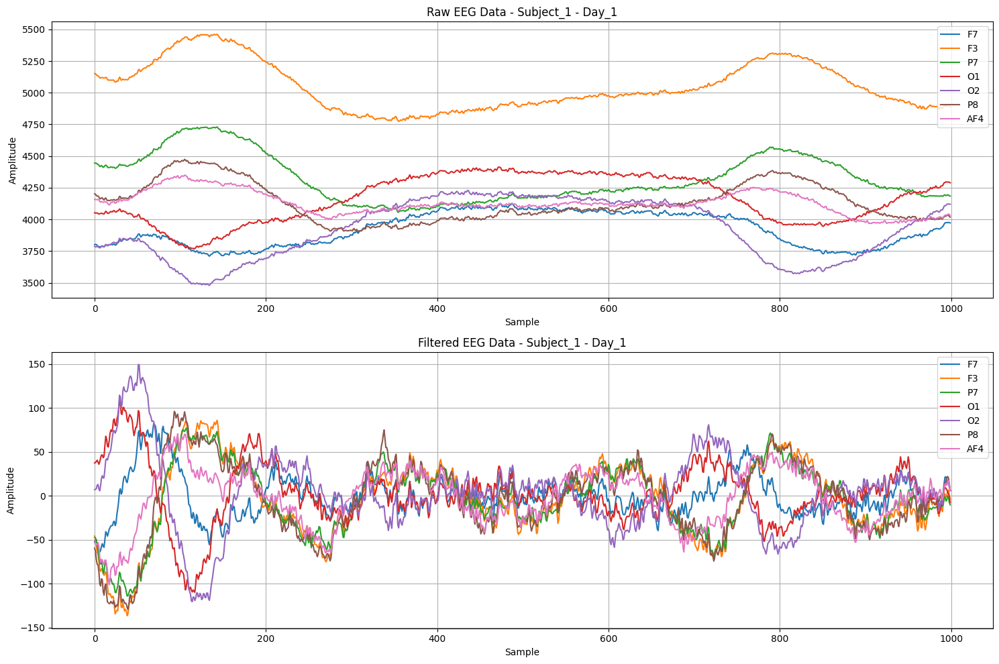

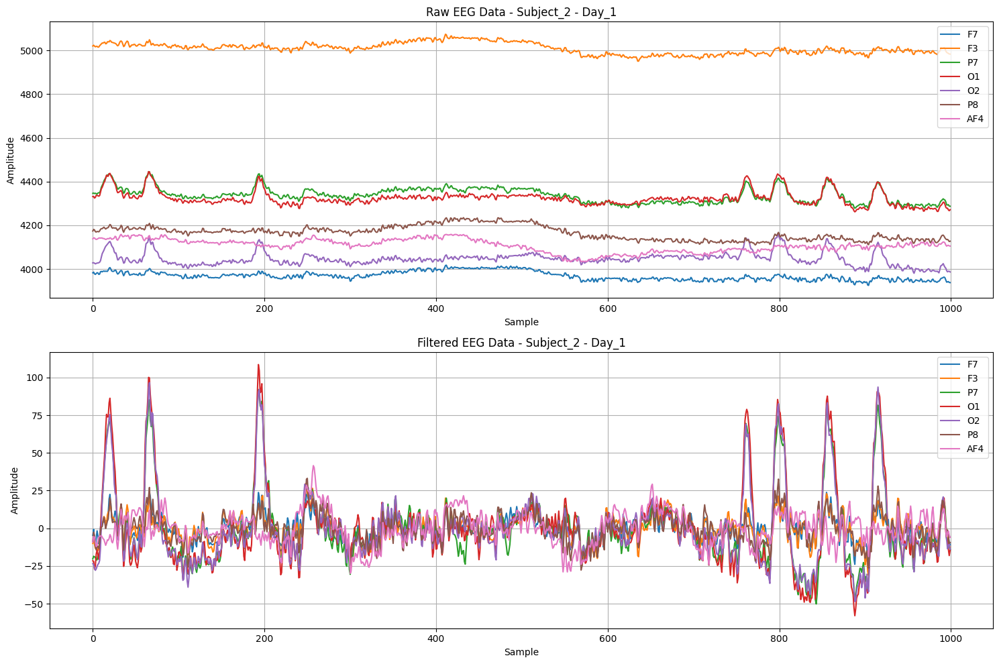

In [394]:
# Áp dụng phân tích và vẽ biểu đồ cho các đối tượng và các ngày thí nghiệm
analyze_data(all_subject_data, filtered_all_subject_data, num_subjects=2, num_days=1, fs=128)

## Apply ICA

In [395]:
import mne
from mne.preprocessing import ICA

def apply_ica(filtered_all_subject_data, channel_names):
    ica_list = {}  # Lưu ICA cho từng đối tượng
    raw_list = {}  # Lưu Raw cho từng đối tượng

    # Duyệt qua từng đối tượng trong all_subject_data
    for subject_name, subject_data in filtered_all_subject_data.items():
        ica_list[subject_name] = []
        raw_list[subject_name] = []

        # Duyệt qua các ngày thí nghiệm của từng đối tượng
        for day, data_one_day in subject_data.items():
            sfreq = 128 
            info = mne.create_info(ch_names=channel_names, sfreq=sfreq, ch_types='eeg')
            filtered_data_mne = data_one_day.T  

            # Tạo đối tượng Raw từ dữ liệu
            raw = mne.io.RawArray(filtered_data_mne, info)

            # Thêm montage(vị tri điện cực chuẩn) vào đối tượng Raw với montage 'standard_1020'
            montage = mne.channels.make_standard_montage('standard_1020')
            raw.set_montage(montage)

            # Áp dụng ICA để tách các thành phần độc lập
            ica = ICA(n_components=7, random_state=42, max_iter='auto')
            ica.fit(raw)
            
            ica_list[subject_name].append(ica)
            raw_list[subject_name].append(raw)

    return ica_list, raw_list

# Giả sử filtered_all_subject_data là dữ liệu đã lọc của tất cả các đối tượng
ica_list, raw_list = apply_ica(filtered_all_subject_data, channel_names)


Creating RawArray with float64 data, n_channels=7, n_times=357224
    Range : 0 ... 357223 =      0.000 ...  2790.805 secs
Ready.
Fitting ICA to data using 7 channels (please be patient, this may take a while)
Selecting by number: 7 components
Fitting ICA took 1.4s.
Creating RawArray with float64 data, n_channels=7, n_times=380344
    Range : 0 ... 380343 =      0.000 ...  2971.430 secs
Ready.
Fitting ICA to data using 7 channels (please be patient, this may take a while)
Selecting by number: 7 components
Fitting ICA took 2.9s.
Creating RawArray with float64 data, n_channels=7, n_times=351204
    Range : 0 ... 351203 =      0.000 ...  2743.773 secs
Ready.
Fitting ICA to data using 7 channels (please be patient, this may take a while)
Selecting by number: 7 components
Fitting ICA took 2.7s.
Creating RawArray with float64 data, n_channels=7, n_times=288752
    Range : 0 ... 288751 =      0.000 ...  2255.867 secs
Ready.
Fitting ICA to data using 7 channels (please be patient, this may tak

In [396]:
raw_list['Subject_1'][2].info

<Info | 8 non-empty values
 bads: []
 ch_names: F7, F3, P7, O1, O2, P8, AF4
 chs: 7 EEG
 custom_ref_applied: False
 dig: 10 items (3 Cardinal, 7 EEG)
 highpass: 0.0 Hz
 lowpass: 64.0 Hz
 meas_date: unspecified
 nchan: 7
 projs: []
 sfreq: 128.0 Hz
>

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.000 (s)
Plotting power spectral density (dB=True).


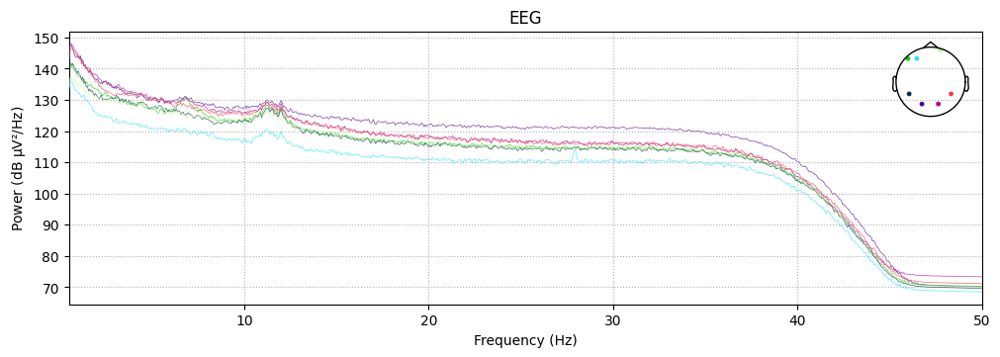

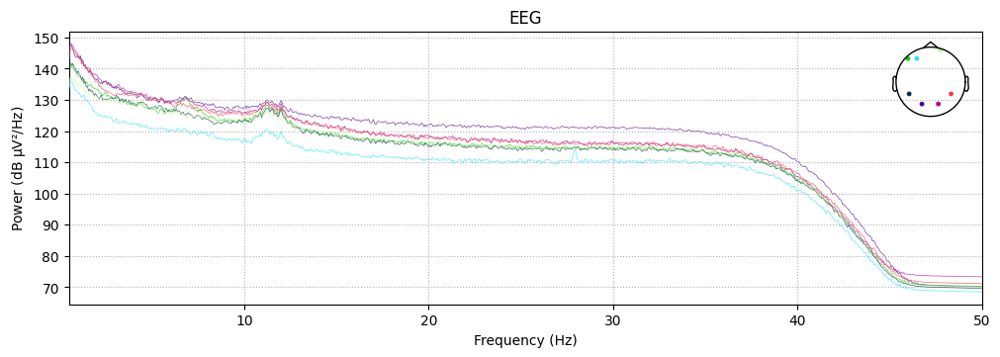

In [397]:
raw_list['Subject_1'][2].plot_psd(fmin=0.5, fmax=50, average=False)

In [398]:
ica_list['Subject_1'][1]

Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,35 iterations on raw data (380344 samples)
ICA components,7
Available PCA components,7
Channel types,eeg
ICA components marked for exclusion,—


In [399]:
def plot_ica_components_and_sources(subject_name, start_day, end_day, ica_list, raw_list):
    """
    Vẽ các thành phần ICA và tín hiệu nguồn cho một đối tượng (subject) cụ thể

    Parameters:
    - subject_name: str, tên của đối tượng cần vẽ.
    - start_day: int, ngày bắt đầu (chỉ số ngày, bắt đầu từ 0).
    - end_day: int, ngày kết thúc (chỉ số ngày, bắt đầu từ 0).
    - ica_list: dict, danh sách các đối tượng ICA theo từng subject.
    - raw_list: dict, danh sách các đối tượng Raw theo từng subject.
    """
    # Kiểm tra xem subject_name có tồn tại trong ica_list và raw_list không
    if subject_name not in ica_list or subject_name not in raw_list:
        print(f"Subject {subject_name} không tồn tại trong danh sách ICA hoặc Raw.")
        return

    # Lặp qua các ngày trong khoảng start_day đến end_day
    for day_idx in range(start_day, end_day + 1):
        ica = ica_list[subject_name][day_idx]
        raw = raw_list[subject_name][day_idx]
        
        print(f"Subject {subject_name}, Day {day_idx + 1}")
        
        # Vẽ tín hiệu nguồn
        ica.plot_sources(raw, start=0, stop=30)
        
        # Vẽ các thành phần ICA
        ica.plot_components(outlines='head')

Subject Subject_2, Day 1
Creating RawArray with float64 data, n_channels=7, n_times=381340
    Range : 0 ... 381339 =      0.000 ...  2979.211 secs
Ready.


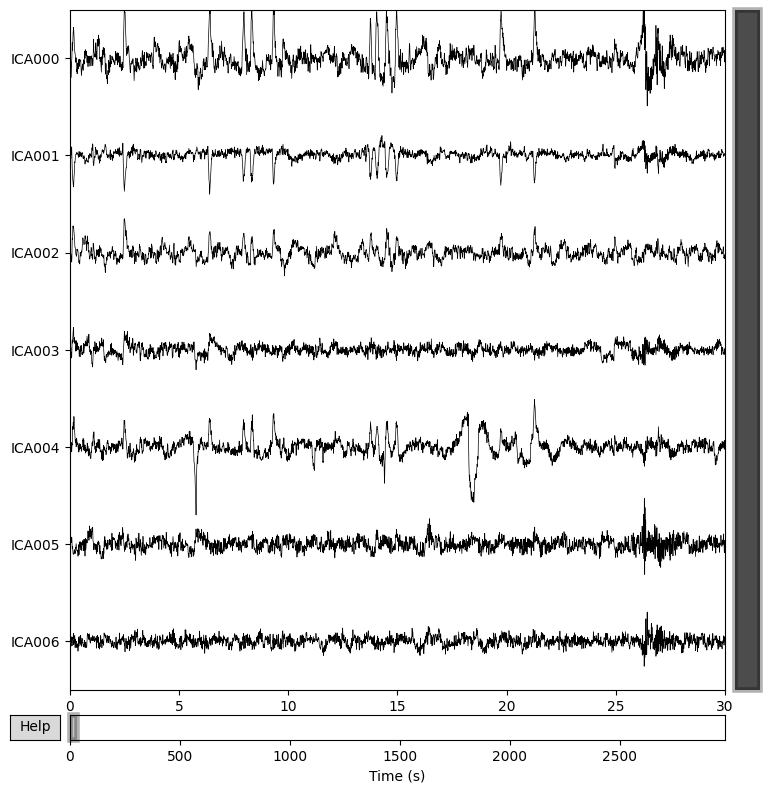

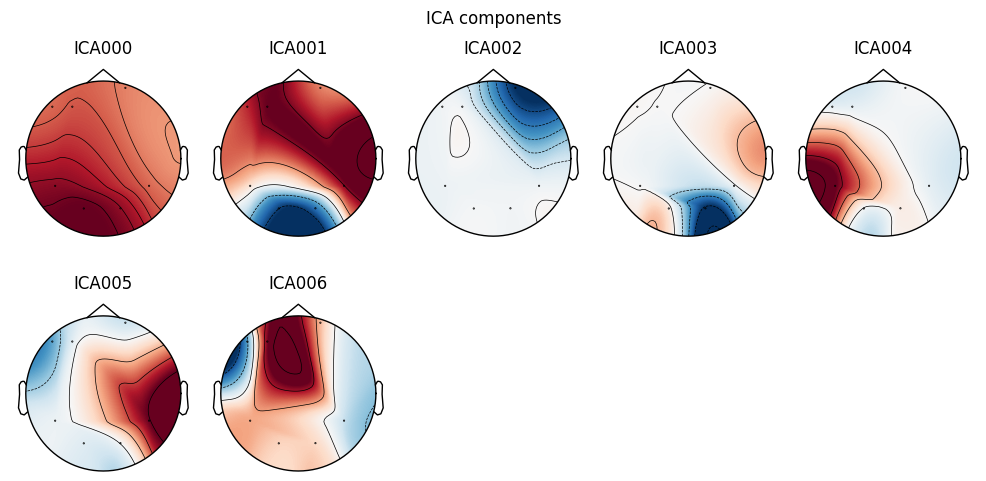

Subject Subject_2, Day 2
Creating RawArray with float64 data, n_channels=7, n_times=391624
    Range : 0 ... 391623 =      0.000 ...  3059.555 secs
Ready.


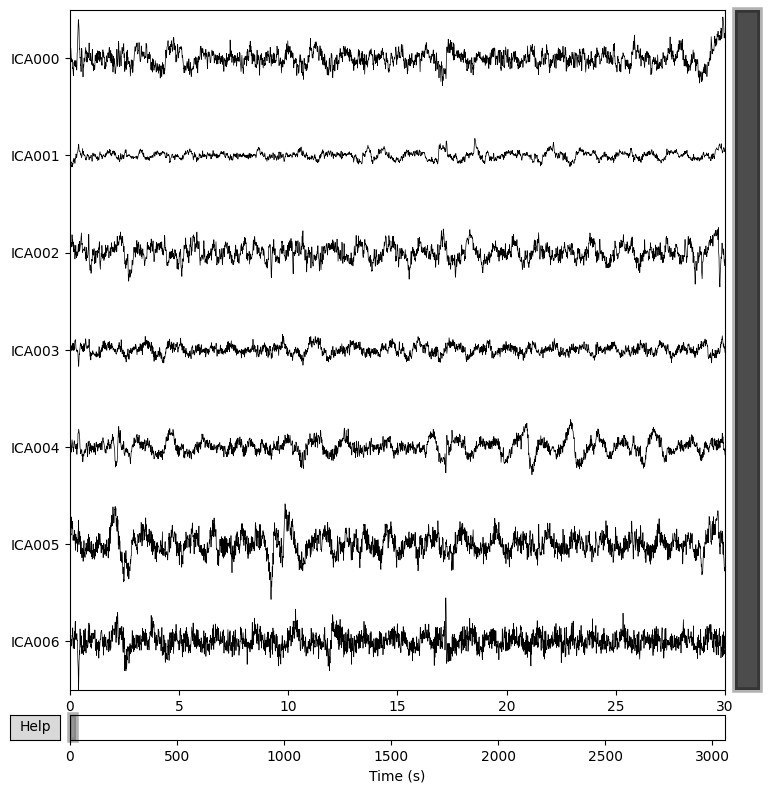

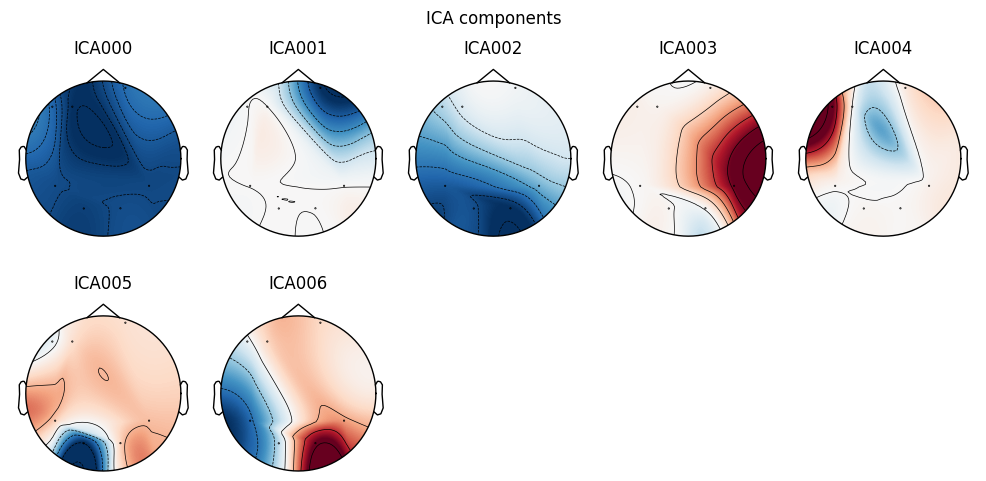

Subject Subject_2, Day 3
Creating RawArray with float64 data, n_channels=7, n_times=356728
    Range : 0 ... 356727 =      0.000 ...  2786.930 secs
Ready.


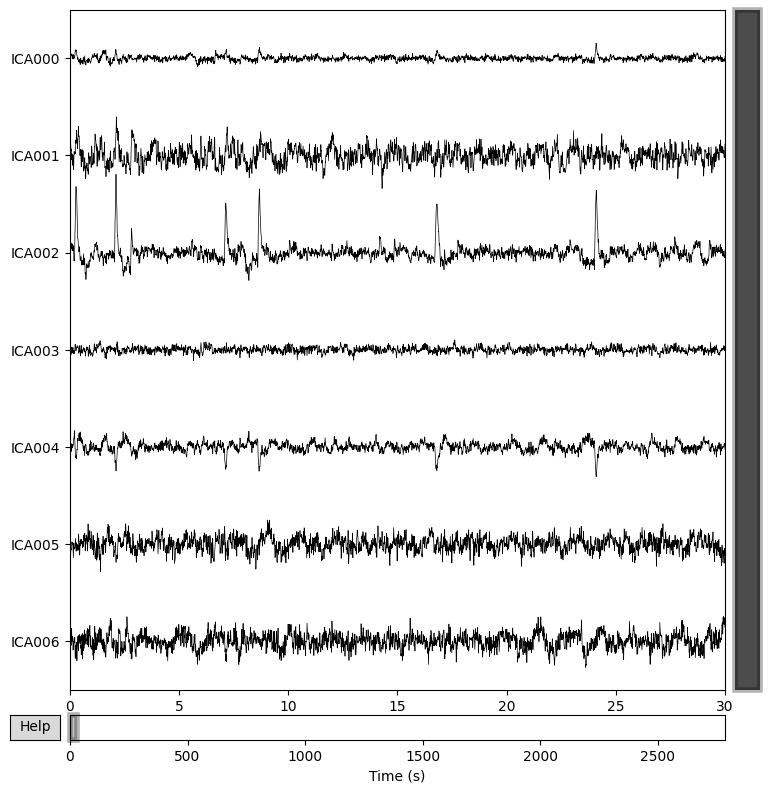

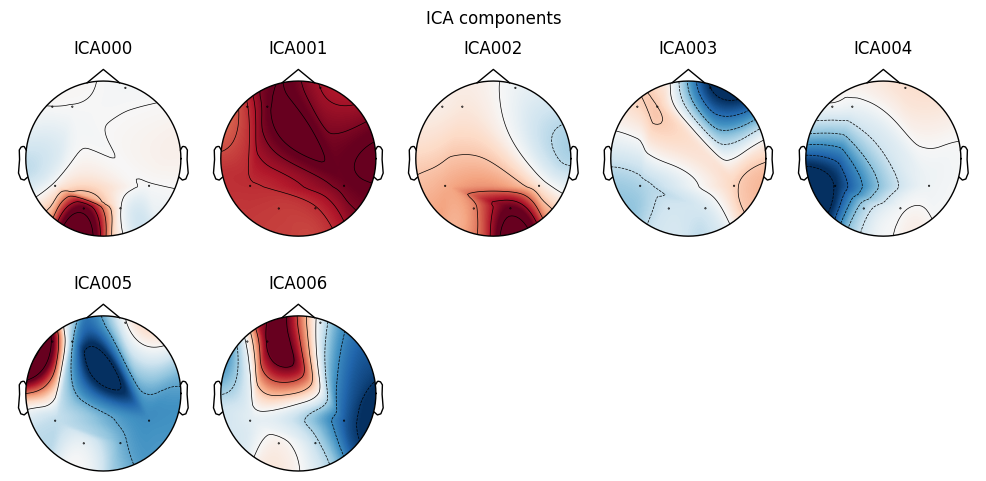

Subject Subject_2, Day 4
Creating RawArray with float64 data, n_channels=7, n_times=373304
    Range : 0 ... 373303 =      0.000 ...  2916.430 secs
Ready.


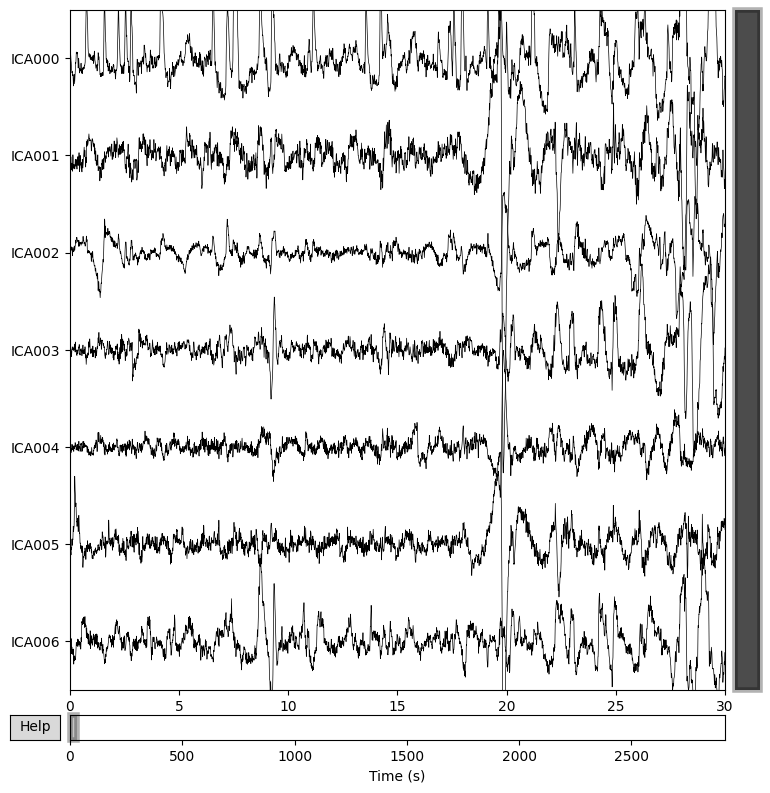

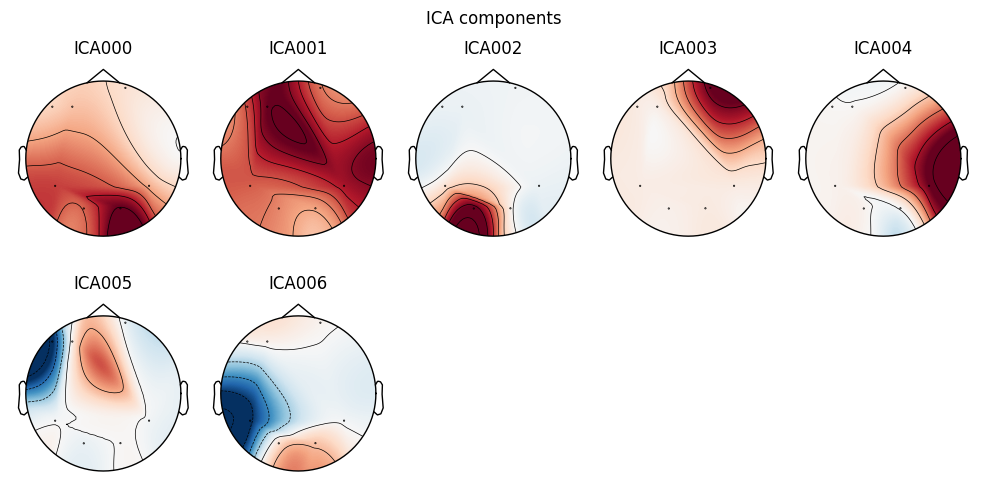

Subject Subject_2, Day 5
Creating RawArray with float64 data, n_channels=7, n_times=345164
    Range : 0 ... 345163 =      0.000 ...  2696.586 secs
Ready.


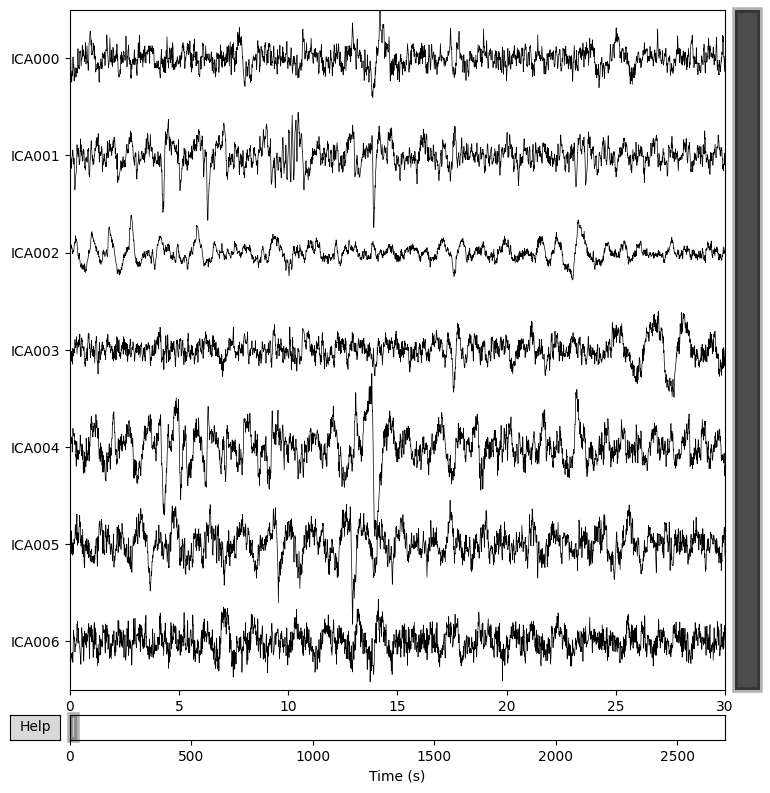

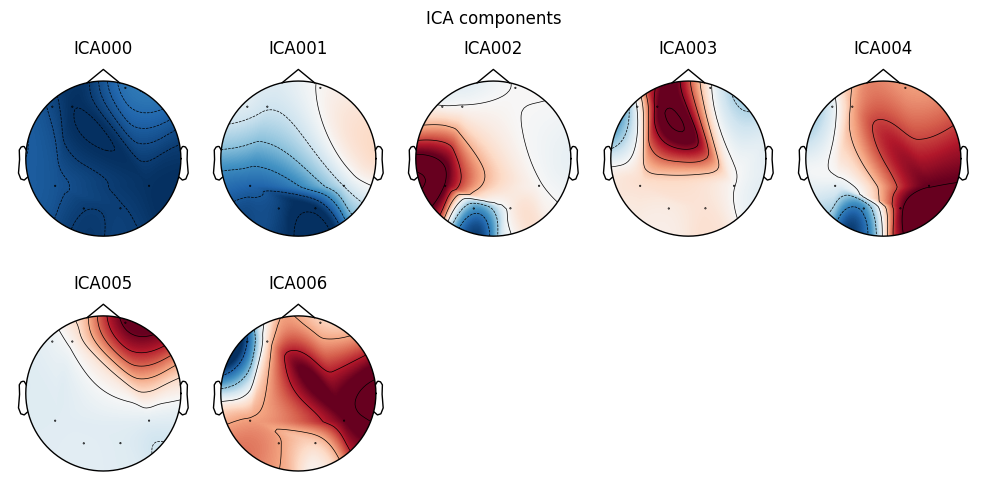

In [400]:
# Vẽ cho Subject_1 từ ngày 1 đến ngày 3
plot_ica_components_and_sources('Subject_2', 0, 4, ica_list, raw_list)

In [401]:
channel_names

['F7', 'F3', 'P7', 'O1', 'O2', 'P8', 'AF4']

In [402]:
eye_channels = ['F7', 'F3', 'AF4']  # Kênh EOG
heart_channels = ['P7', 'P8', 'O1', 'O2']  # Kênh ECG

Using EOG channels: F7, F3, AF4
EOG channel index for this subject is: [0 1 6]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Selecting channel F7 for blink detection
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

Now detecting blinks and generating corresponding events
Found 3 significant peaks
Number of EOG events detected: 3
Not setting metadata
3 matching events found
No baseline correction applied
Using data from preloaded Raw for 3 events and 129 original time points ...
0 bad epochs dropped
Applying baseline correcti

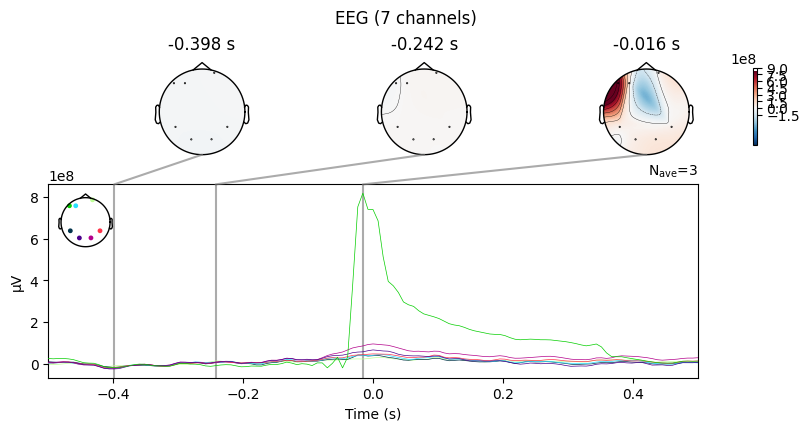

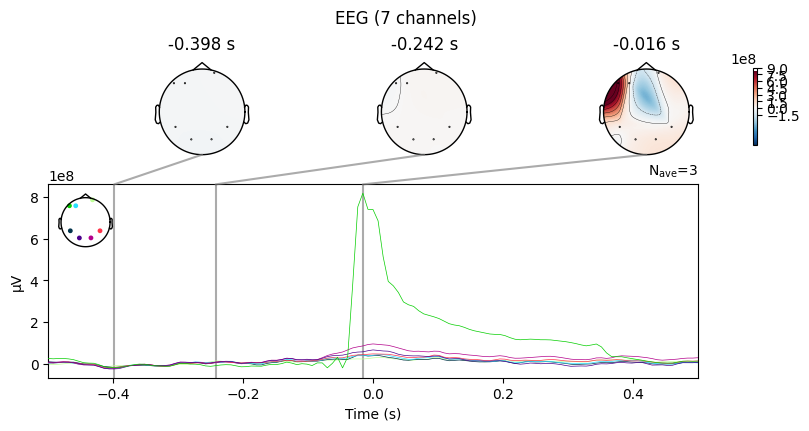

In [403]:
from mne.preprocessing import create_eog_epochs


# Specify the subject and day
subject = 'Subject_1'
day = 1

# Get the raw object
raw = raw_list[subject][day]

# Create EOG epochs and plot
eog_evoked = create_eog_epochs(raw, ch_name=eye_channels).average()
eog_evoked.apply_baseline(baseline=(None, -0.2))
eog_evoked.plot_joint()

In [404]:
eye_channels = ['F7', 'AF4']  # Kênh EOG
heart_channels = ['P7']  # Kênh ECG
threshold_ecg = 0.5  # Define the threshold for ECG

def detect_noisy_components(ica_list, raw_list, threshold_eog=3.0, threshold_ecg=0.5):
    exclude_components_dict = {}

    for subject, ica_subject in ica_list.items():
        exclude_components_dict[subject] = {}
        for day_idx, ica in enumerate(ica_subject):
            raw = raw_list[subject][day_idx]

            # Phát hiện các thành phần liên quan đến EOG
            eog_indices, _ = ica.find_bads_eog(raw, threshold=threshold_eog, ch_name=eye_channels)
            print(f"Subject {subject}, Day {day_idx + 1} - EOG components: {eog_indices}")

            # Phát hiện các thành phần liên quan đến ECG
            ecg_indices = []
            for heart_channel in heart_channels:
                if heart_channel in raw.info['ch_names']:
                    ecg_idx, _ = ica.find_bads_ecg(raw, threshold=threshold_ecg, ch_name=heart_channel)
                    ecg_indices.extend(ecg_idx)
            ecg_indices = list(set(ecg_indices))  # Loại bỏ trùng lặp
            print(f"Subject {subject}, Day {day_idx + 1} - ECG components: {ecg_indices}")

            # Gộp các thành phần bị loại bỏ (EOG + ECG)
            exclude_indices = list(set(eog_indices + ecg_indices))
            exclude_components_dict[subject][day_idx] = exclude_indices

            # Đánh dấu các thành phần bị loại bỏ
            ica.exclude = exclude_indices

    return exclude_components_dict


In [405]:
# Detect noisy components
exclude_components_dict = detect_noisy_components(ica_list, raw_list)

Using EOG channels: F7, AF4
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 H

In [406]:
def apply_ica_and_clean_data(ica_list, raw_list, exclude_components_dict):
    cleaned_raw_list = {}

    for subject, ica_subject in ica_list.items():
        cleaned_raw_list[subject] = []
        for day_idx, ica in enumerate(ica_subject):
            raw = raw_list[subject][day_idx]

            # Lấy danh sách các thành phần cần loại bỏ từ exclude_components_dict
            exclude_components = exclude_components_dict[subject].get(day_idx, [])
            
            # Đánh dấu các thành phần nhiễu để loại bỏ
            ica.exclude = exclude_components

            # Áp dụng ICA để loại bỏ các thành phần nhiễu
            raw_cleaned = ica.apply(raw.copy())  

            cleaned_raw_list[subject].append(raw_cleaned)

    return cleaned_raw_list


In [407]:
cleaned_raw_list = apply_ica_and_clean_data(ica_list, raw_list, exclude_components_dict)

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA comp

In [408]:
def store_cleaned_data_as_filtered_dict(cleaned_raw_list):
    """
    Lưu dữ liệu đã làm sạch vào dict mới với cấu trúc filtered_all_subject_data.

    Parameters:
    - cleaned_raw_list: dict, danh sách các đối tượng Raw sau khi đã loại bỏ nhiễu.

    Returns:
    - filtered_all_subject_data: dict, cấu trúc dữ liệu sạch theo subject và ngày.
    """
    eeg_data_ica_filterd = {}

    for subject, raw_subject in cleaned_raw_list.items():
        eeg_data_ica_filterd[subject] = {}

        for day_idx, raw_data in enumerate(raw_subject):
            day_key = f"Day_{day_idx + 1}" 
            data_array = raw_data.get_data()
            eeg_data_ica_filterd[subject][day_key] = data_array

    return eeg_data_ica_filterd

# Lưu dữ liệu sạch vào dict mới
eeg_data_ica_filterd = store_cleaned_data_as_filtered_dict(cleaned_raw_list)


In [409]:
eeg_data_ica_filterd['Subject_1']['Day_2'].shape

(7, 380344)

In [410]:
def split_data_by_state(subject_data, focus_duration=10, unfocus_duration=10, sfreq=128):
    focus_samples = focus_duration * 60 * sfreq  # Số mẫu trong 10 phút
    unfocus_samples = unfocus_duration * 60 * sfreq  # Số mẫu trong 10 phút
    
    split_data = {'focus': {}, 'unfocus': {}, 'drowsy': {}}
    
    for subject, days_data in subject_data.items():
        split_data['focus'][subject] = {}
        split_data['unfocus'][subject] = {}
        split_data['drowsy'][subject] = {}
        
        for day, data in days_data.items():
            # Dữ liệu có kích thước (num_channels, num_samples)
            # focus_data lấy từ mẫu 0 -> focus_samples
            focus_data = data[:, :focus_samples]
            # unfocus_data lấy từ focus_samples -> focus_samples*2
            unfocus_data = data[:, focus_samples:focus_samples + unfocus_samples]
            # drowsy_data lấy từ focus_samples*2 -> focus_samples*3
            drowsy_data = data[:, focus_samples + unfocus_samples:focus_samples + 2 * unfocus_samples]
            
            # Lưu dữ liệu của mỗi trạng thái cho từng ngày
            split_data['focus'][subject][day] = focus_data
            split_data['unfocus'][subject][day] = unfocus_data
            split_data['drowsy'][subject][day] = drowsy_data
    
    return split_data

data_split = split_data_by_state(eeg_data_ica_filterd, focus_duration=10, unfocus_duration=10, sfreq=128)


In [411]:
data_split['focus']['Subject_1']['Day_1'].shape

(7, 76800)

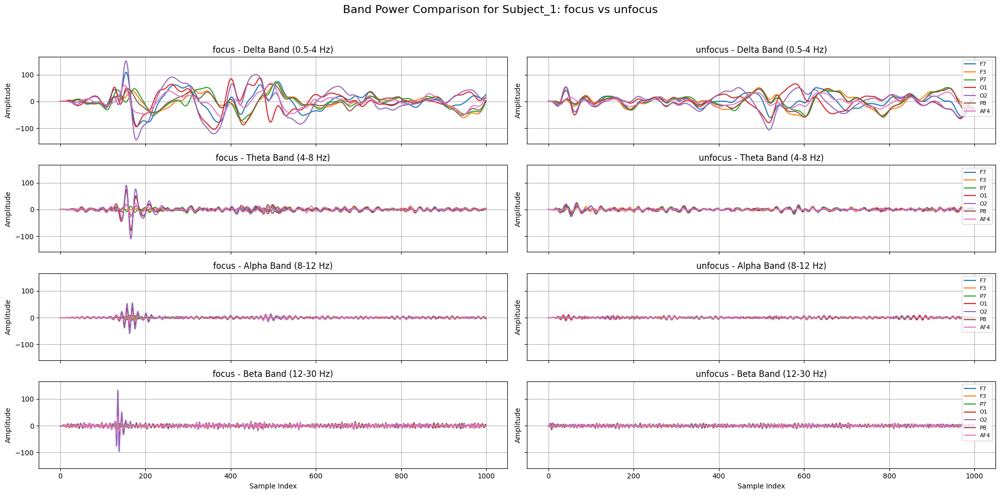

In [412]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import butter, lfilter

def bandpass_filter(data, sfreq, low, high, order=5):
    nyquist = 0.5 * sfreq
    low = low / nyquist
    high = high / nyquist
    b, a = butter(order, [low, high], btype='band')
    return lfilter(b, a, data, axis=1)  # Chỉnh sửa axis=1 để áp dụng bộ lọc theo chiều mẫu (columns)

def plot_comparison_band_power(data_split, sfreq, band_ranges, subject, states, sample_range):
    start, end = sample_range
    sample_steps = np.arange(start, end)  # Trục X là sample size
    fig, axs = plt.subplots(len(band_ranges), 2, figsize=(20, 10), sharex=True, sharey=True)
    fig.suptitle(f'Band Power Comparison for {subject}: {states[0]} vs {states[1]}', fontsize=16)

    for col, state in enumerate(states):
        data = data_split[state][subject]['Day_1'][:, start:end]  # Lấy dữ liệu theo trạng thái và sample range
        
        for row, (band, (low, high)) in enumerate(band_ranges.items()):
            # Lọc dữ liệu cho band hiện tại
            filtered_data = bandpass_filter(data, sfreq, low, high)
            
            # Vẽ dữ liệu cho mỗi channel
            for ch in range(filtered_data.shape[0]):  # Axis 0 là num_channels
                axs[row, col].plot(sample_steps, filtered_data[ch, :], label=channel_names[ch])
            
            axs[row, col].set_title(f'{state} - {band} Band ({low}-{high} Hz)', fontsize=12)
            axs[row, col].set_ylabel('Amplitude')
            axs[row, col].grid(True)
            if col == 1:
                axs[row, col].legend(fontsize=8)

    axs[-1, 0].set_xlabel('Sample Index')
    axs[-1, 1].set_xlabel('Sample Index')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Sử dụng hàm
band_ranges = {'Delta': (0.5, 4), 'Theta': (4, 8), 'Alpha': (8, 12), 'Beta': (12, 30)}
sfreq = 128  # Tần số lấy mẫu
sample_range = (0, 1000)  # Khoảng sample cần hiển thị

subject = 'Subject_1'
states = ['focus', 'unfocus']  # Hai trạng thái cần so sánh

plot_comparison_band_power(data_split, sfreq, band_ranges, subject, states, sample_range)


## 2. Features Engineering

Sử dụng biến đổi Fourier bằng STFT

Trong quá trình xử lý tín hiệu EEG trong tập lệnh trên, Biến đổi Fourier được sử dụng để chuyển đổi tín hiệu từ miền thời gian sang miền tần số. Việc sử dụng biến đổi Fourier, cụ thể là Biến đổi Fourier ngắn hạn (STFT), mang lại nhiều lợi ích trong việc phân tích và trích xuất đặc trưng từ tín hiệu EEG.

1. Lý do sử dụng Biến đổi Fourier trong xử lý tín hiệu EEG:

Phân tích thành phần tần số: Tín hiệu EEG là một dạng tín hiệu phức tạp, chứa đựng thông tin ở nhiều dải tần số khác nhau. Mỗi dải tần số tương ứng với các hoạt động não bộ cụ thể:
Delta (0.5 - 4 Hz): Liên quan đến giấc ngủ sâu.
Theta (4 - 8 Hz): Liên quan đến buồn ngủ, mơ mộng.
Alpha (8 - 12 Hz): Liên quan đến thư giãn, tỉnh táo.
Beta (12 - 30 Hz): Liên quan đến tập trung, hoạt động nhận thức.
Trích xuất đặc trưng hữu ích: Việc chuyển tín hiệu sang miền tần số cho phép trích xuất công suất tại các dải tần số quan trọng, giúp phân biệt các trạng thái não bộ khác nhau.
Hiểu rõ hơn về hoạt động não bộ: Phân tích tần số giúp xác định các mẫu sóng đặc trưng, hỗ trợ trong việc chẩn đoán và nghiên cứu khoa học.

$n Segments = \frac{numSample}{segmentLenght}$

In [413]:
data_split['focus']['Subject_1']['Day_2'].shape

(7, 76800)

#### trích xuất bằng năng lượng phổ 

In [414]:
import numpy as np
from scipy.signal import stft

def apply_stft_to_data_split(data_split, fs, window, nperseg, noverlap, nfft):
    power_result = {}

    for state, subjects_data in data_split.items():
        power_result[state] = {}
        for subject, days_data in subjects_data.items():
            n_channels, n_samples = next(iter(days_data.values())).shape  # Số kênh và số mẫu

            # Danh sách để lưu năng lượng phổ của từng kênh
            power_day_result = {}

            # Tính STFT cho từng kênh
            for day, data in days_data.items():
                power_day_list = []
                for ch in range(n_channels):
                    f, t, Zxx = stft(data[ch, :], fs=fs, window=window, nperseg=nperseg, 
                                     noverlap=noverlap, nfft=nfft, detrend=False, 
                                     return_onesided=True, boundary='zeros', padded=True)
                    power_day_list.append(np.abs(Zxx) ** 2)  # Năng lượng phổ

                # Lưu kết quả của mỗi ngày riêng biệt (không gộp lại thành mảng 4D)
                power_day_result[day] = np.stack(power_day_list, axis=0)  # (n_channels, nfft // 2 + 1, n_time_windows)

            # Lưu kết quả của từng subject cho từng trạng thái
            power_result[state][subject] = power_day_result

    return power_result


In [415]:
# Cấu hình thông số STFT
fs = 128  # Tần số mẫu (Hz)
nperseg = 128  # Số mẫu trong mỗi cửa sổ (1 giây)
noverlap = 0  # Không chồng lấn
nfft = 1024  # Số điểm FFT
M = nperseg  # Độ dài cửa sổ Blackman
t_win = np.arange(0, M)
window_blackman = 0.42 - 0.5 * np.cos((2 * np.pi * t_win) / (M - 1)) + 0.08 * np.cos((4 * np.pi * t_win) / (M - 1))

# Áp dụng STFT cho dữ liệu
power_result = apply_stft_to_data_split(data_split, fs, window_blackman, nperseg, noverlap, nfft)


In [416]:
(14, 4, 117)

(14, 4, 117)

In [417]:
power_result['focus']['Subject_1']['Day_1'].shape

(7, 513, 601)

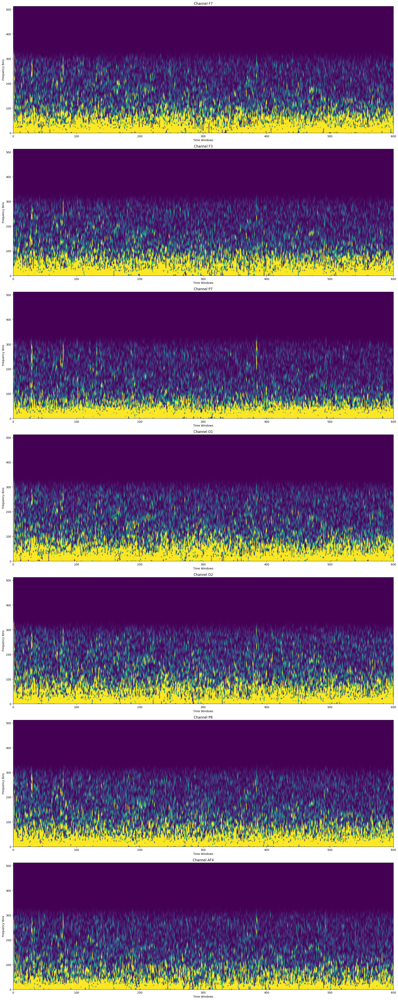

In [418]:
# Validate the power value for each channel in the 'focus' state for a specific subject
subject = 'Subject_1'
state = 'focus'
power_focus = power_result[state][subject]['Day_1']
col = power_focus.shape[0]

fig, ax = plt.subplots(col, 1, figsize=(20, 50))

for i in range(col):
    ax[i].pcolormesh(power_focus[i, :, :], vmin=0, vmax=2*np.sqrt(2), shading='gouraud')
    ax[i].set_title(f'Channel {channel_names[i]}')
    ax[i].set_xlabel('Time Windows')
    ax[i].set_ylabel('Frequency Bins')

plt.tight_layout()
plt.show()

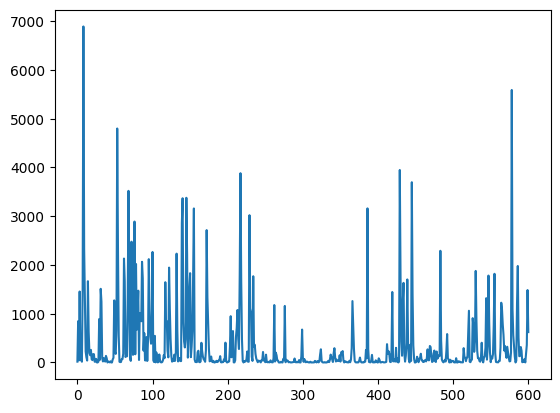

In [419]:
plt.plot(power_result['focus']['Subject_1']['Day_1'][2,1,:])

In [420]:
def combine_bins(power_result, n_bins=36, bin_size=4):
    power_result_binned = {}

    # Duyệt qua từng trạng thái (focus, unfocus, drowsy)
    for state, subjects_data in power_result.items():
        power_result_binned[state] = {}
        for subject, days_data in subjects_data.items():
            power_result_binned[state][subject] = {}
            for day, power in days_data.items():
                n_channels, n_freq_bins, n_time_windows = power.shape

                # Tạo mảng lưu dữ liệu đã gộp bins
                power_binned = np.zeros((n_channels, n_bins, n_time_windows))

                # Gộp các bins theo khoảng bin_size (0.5 Hz)
                for ch in range(n_channels):
                    for j in range(n_bins):
                        start_idx = j * bin_size
                        end_idx = start_idx + bin_size
                        power_binned[ch, j, :] = np.mean(power[ch, start_idx:end_idx, :], axis=0)

                # Lưu kết quả cho subject và day
                power_result_binned[state][subject][day] = power_binned

    return power_result_binned


In [421]:
power_result_binned = combine_bins(power_result, n_bins=36, bin_size=4)
power_result_binned['focus']['Subject_1']['Day_1'].shape

(7, 36, 601)

In [422]:
def average_running_window(power_result_binned, window_size=15):
    power_result_averaged = {}

    # Duyệt qua từng trạng thái (focus, unfocus, drowsy)
    for state, subjects_data in power_result_binned.items():
        power_result_averaged[state] = {}
        for subject, days_data in subjects_data.items():
            power_result_averaged[state][subject] = {}
            for day, power in days_data.items():
                n_channels, n_bins, n_time_windows = power.shape
                n_output_time_windows = n_time_windows - window_size + 1  # Số cửa sổ chạy

                # Tạo mảng lưu dữ liệu trung bình
                power_averaged = np.zeros((n_channels, n_bins, n_output_time_windows))

                # Tính trung bình qua cửa sổ chạy
                for t in range(n_output_time_windows):
                    power_averaged[:, :, t] = np.mean(power[:, :, t:t + window_size], axis=2)

                # Lưu kết quả cho subject và day
                power_result_averaged[state][subject][day] = power_averaged

    return power_result_averaged


In [423]:
power_result_averaged = average_running_window(power_result_binned, window_size=15)
power_result_averaged['focus']['Subject_1']['Day_1'].shape  

(7, 36, 587)

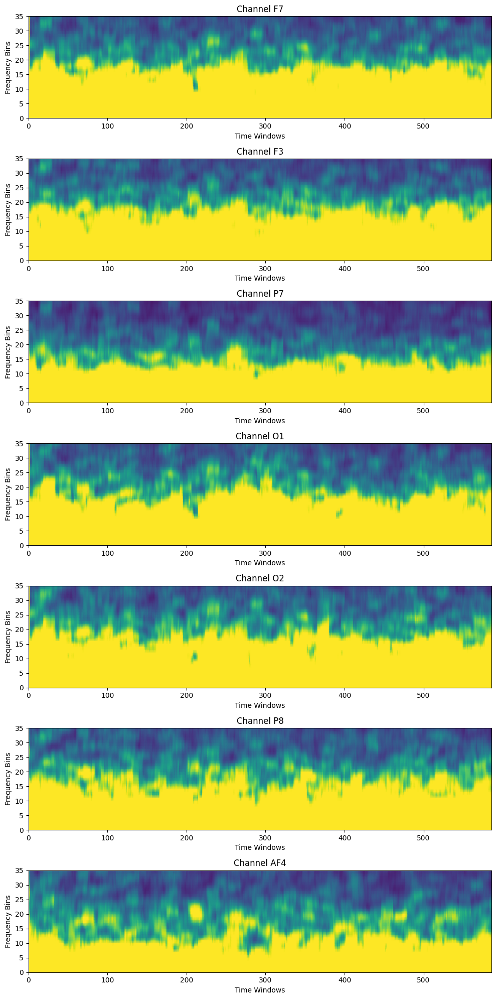

In [424]:
fig, ax = plt.subplots(col, 1)
t1 = np.arange(0, power_result_averaged['focus']['Subject_1']['Day_1'].shape[2])
f1 = np.arange(0, power_result_averaged['focus']['Subject_1']['Day_1'].shape[1])
fig.set_size_inches(10, 20)
for i in range(col):
    ax[i].pcolormesh(t1, f1, power_result_averaged['focus']['Subject_1']['Day_1'][i, :, :], vmin=0, vmax=2*np.sqrt(2), shading='gouraud')
    ax[i].set_title(f'Channel {channel_names[i]}')
    ax[i].set_xlabel('Time Windows')
    ax[i].set_ylabel('Frequency Bins')
plt.tight_layout()
plt.show()

In [425]:
power_result_averaged['focus']['Subject_1']['Day_1'].shape

(7, 36, 587)

In [458]:
focus = {}
unfocus = {}
drowsy = {}

# Initialize the dictionaries with zeros
for subject in power_result_averaged['focus'].keys():
    n_channels, n_frequencies, n_time_windows = power_result_averaged['focus'][subject]['Day_1'].shape
    focus[subject] = {day: np.zeros([n_channels * n_frequencies, n_time_windows]) for day in power_result_averaged['focus'][subject].keys()}
    unfocus[subject] = {day: np.zeros([n_channels * n_frequencies, n_time_windows]) for day in power_result_averaged['focus'][subject].keys()}
    drowsy[subject] = {day: np.zeros([n_channels * n_frequencies, n_time_windows]) for day in power_result_averaged['focus'][subject].keys()}

# Reshape and log-transform the data
for subject in power_result_averaged['focus'].keys():
    for day in power_result_averaged['focus'][subject].keys():
        for j in range(n_time_windows):
            focus[subject][day][:, j] += power_result_averaged['focus'][subject][day][:, :, j].flatten()
            unfocus[subject][day][:, j] += power_result_averaged['unfocus'][subject][day][:, :, j].flatten()
            drowsy[subject][day][:, j] += power_result_averaged['drowsy'][subject][day][:, :, j].flatten()

        # Apply log-transform
        focus[subject][day] = 10 * np.log10(focus[subject][day])
        unfocus[subject][day] = 10 * np.log10(unfocus[subject][day])
        drowsy[subject][day] = 10 * np.log10(drowsy[subject][day])


In [459]:
focus['Subject_1']['Day_1'].shape

(252, 587)

#### trích xuất bằng năng lượng dải tần số

In [558]:
!pip install PyWavelets -q

In [567]:
channel_names

['F7', 'F3', 'P7', 'O1', 'O2', 'P8', 'AF4']

In [ ]:
locs_2d = np.array([
    (5.0, 9.0),       # Trán phải (AF4)
    (-3.0, 5.0),      # Thái dương trái (F7)
    (-7.0, 3.0),      # Đỉnh trái (F3)
    (0.0, -9.0),      # Gáy (O1)
    (-3.0, 8.0),      # Thái dương trước trái (O2)
    (3.0, 8.0),       # Thái dương trước phải (P7)
    (-7.0, 1.0),      # Sau gáy trái (P8)
])

In [563]:
import numpy as np
from scipy.signal import stft
import matplotlib.pyplot as plt

def eeg_to_spectrum_images(data_split, fs, window_size, stride):
    """
    Convert EEG signals to spectrum images for CNN training.
   
    Args:
        data_split (dict): EEG data split by state, subject, and day.
        fs (int): Sampling frequency (Hz).
        window_size (int): Window size (samples).
        stride (int): Window stride (samples).
   
    Returns:
        images (dict): Spectrum images with shape [state][subject][day][n_segments, freq_features, time_features, 3]
    """
    # Frequency bands (Hz) representing RGB channels
    freq_bands = {
        "theta": (4, 8),   # Red
        "alpha": (8, 13),  # Green
        "beta": (13, 18)   # Blue 
    }
   
    images = {}
   
    for state, subjects_data in data_split.items():
        images[state] = {}
       
        for subject, days_data in subjects_data.items():
            images[state][subject] = {}
           
            for day, eeg_data in days_data.items():
                n_channels, n_samples = eeg_data.shape
               
                # Calculate number of segments, ensuring it doesn't exceed data length
                n_segments = max(1, (n_samples - window_size) // stride + 1)
               
                # Preallocate list for day images
                day_images = []
               
                for seg_idx in range(n_segments):
                    # Calculate segment start and end
                    start = seg_idx * stride
                    end = min(start + window_size, n_samples)
                   
                    # Skip if segment is too small
                    if end - start < window_size:
                        break
                    # Extract segment (across all channels)
                    segment = eeg_data[:, start:end]
                   
                    # Compute STFT for each channel and average
                    channel_stfts = []
                    for channel in range(n_channels):
                        f, t, Zxx = stft(segment[channel], fs=fs, nperseg=window_size, noverlap=stride)
                        channel_stfts.append(np.abs(Zxx) ** 2)
                   
                    # Average across channels
                    power_spectral = np.mean(channel_stfts, axis=0)
                   
                    # Initialize band powers with correct shape
                    band_powers = np.zeros((len(f) // 2, len(t), 3))  # 3 channels for RGB
                   
                    # Compute power for each frequency band
                    for i, (band_name, (low, high)) in enumerate(freq_bands.items()):
                        # Get positive frequencies
                        f_pos = f[:len(f) // 2]
                        
                        # Create band mask
                        band_mask = (f_pos >= low) & (f_pos < high)
                       
                        # Ensure we have indices in the band
                        if np.any(band_mask):
                            # Sum power within the band for each time point
                            band_powers[:, :, i] = np.log1p(np.mean(power_spectral[:len(f) // 2, :][band_mask], axis=0))
                   
                    # Normalize band powers to [0, 1]
                    if np.max(band_powers) > 0:
                        band_powers = (band_powers - np.min(band_powers)) / (np.max(band_powers) - np.min(band_powers))
                   
                    day_images.append(band_powers)
               
                # Convert to numpy array if day_images is not empty
                if day_images:
                    images[state][subject][day] = np.array(day_images)
   
    return images

# Example usage function
def process_eeg_to_spectrum_images(data_split):
    """
    Helper function to process EEG data and print diagnostic information.
    """
    # Parameters
    fs = 128  # Sampling frequency
    window_size = 512  # Increase window size to increase time features
    stride = 128  # Keep stride as is, or adjust to fine-tune overlap
    
    try:
        # Convert EEG to spectrum images
        images = eeg_to_spectrum_images(data_split, fs, window_size, stride)
        
        # Print diagnostic information
        print("Conversion successful!")
        for state in images:
            for subject in images[state]:
                for day in images[state][subject]:
                    print(f"{state}/{subject}/{day} shape: {images[state][subject][day].shape}")
        
        return images
    except Exception as e:
        print(f"Error during conversion: {e}")
        raise

images = process_eeg_to_spectrum_images(data_split)


Conversion successful!
focus/Subject_1/Day_1 shape: (597, 128, 3, 3)
focus/Subject_1/Day_2 shape: (597, 128, 3, 3)
focus/Subject_1/Day_3 shape: (597, 128, 3, 3)
focus/Subject_1/Day_4 shape: (597, 128, 3, 3)
focus/Subject_1/Day_5 shape: (597, 128, 3, 3)
focus/Subject_2/Day_1 shape: (597, 128, 3, 3)
focus/Subject_2/Day_2 shape: (597, 128, 3, 3)
focus/Subject_2/Day_3 shape: (597, 128, 3, 3)
focus/Subject_2/Day_4 shape: (597, 128, 3, 3)
focus/Subject_2/Day_5 shape: (597, 128, 3, 3)
focus/Subject_3/Day_1 shape: (597, 128, 3, 3)
focus/Subject_3/Day_2 shape: (597, 128, 3, 3)
focus/Subject_3/Day_3 shape: (597, 128, 3, 3)
focus/Subject_3/Day_4 shape: (597, 128, 3, 3)
focus/Subject_3/Day_5 shape: (597, 128, 3, 3)
focus/Subject_4/Day_1 shape: (597, 128, 3, 3)
focus/Subject_4/Day_2 shape: (597, 128, 3, 3)
focus/Subject_4/Day_3 shape: (597, 128, 3, 3)
focus/Subject_4/Day_4 shape: (597, 128, 3, 3)
focus/Subject_5/Day_1 shape: (597, 128, 3, 3)
focus/Subject_5/Day_2 shape: (597, 128, 3, 3)
focus/Subje

In [561]:
images['focus']['Subject_5']['Day_4'].shape

(597, 128, 3, 3)

In [430]:
# # Ví dụ hiển thị ảnh của kênh đầu tiên, trạng thái 'focus', subject 'Subject_1', ngày 'Day_1'
# example_image = images['focus']['Subject_1']['Day_1'][0, 3]  # Ảnh của segment đầu tiên, kênh đầu tiên
# plt.imshow(example_image)
# plt.title("EEG Time-Frequency Image")
# plt.xlabel("Time")
# plt.ylabel("Frequency Bands (RGB)")
# plt.show()

In [431]:
# import numpy as np
# from scipy.signal import stft
# from scipy.stats import skew, kurtosis

# def extract_features(data_split, fs, window_size, stride):
#     """
#     Trích xuất đặc trưng từ EEG dữ liệu sử dụng STFT.
#     Args:
#         data_split (dict): Dữ liệu EEG đã chia theo trạng thái và subject.
#         fs (int): Tần số lấy mẫu (Hz).
#         window_size (int): Kích thước mỗi segment (samples).
#         stride (int): Độ dịch của mỗi segment (samples).
#     Returns:
#         features (dict): Đặc trưng cho từng trạng thái và subject.
#     """
#     features = {}

#     # Các dải tần số 
#     freq_bands = {
#         "delta": (0.5, 4),
#         "theta": (4, 8),
#         "alpha": (8, 13),
#         "beta": (13, 18),
#     }

#     for state, subjects_data in data_split.items():
#         features[state] = {}
#         for subject, days_data in subjects_data.items():
#             features[state][subject] = {}
#             for day, eeg_data in days_data.items():
#                 n_channels, n_samples = eeg_data.shape
#                 n_segments = (n_samples - window_size) // stride + 1
#                 n_features = 8  # 4 từ STFT + 4 từ miền thời gian

#                 subject_features = np.zeros((n_channels, n_segments, n_features))

#                 # Trích xuất đặc trưng cho từng kênh
#                 for ch in range(n_channels):
#                     for seg_idx in range(n_segments):
#                         start = seg_idx * stride
#                         end = start + window_size
#                         segment = eeg_data[ch, start:end]

#                         # Tính STFT
#                         f, t, Zxx = stft(segment, fs=fs, nperseg=window_size)

#                         # Đặc trưng miền tần số từ STFT
#                         stft_features = [
#                             np.sum(np.abs(Zxx[(f >= band[0]) & (f < band[1]), :]) ** 2)
#                             for band in freq_bands.values()
#                         ]

#                         # Đặc trưng miền thời gian
#                         time_features = [
#                             np.mean(segment),
#                             np.var(segment),
#                             skew(segment),
#                             kurtosis(segment)
#                         ]

#                         # Gộp tất cả đặc trưng
#                         subject_features[ch, seg_idx, :] = stft_features + time_features

#                 features[state][subject][day] = subject_features

#     return features

# # Example Usage
# fs = 128  # Tần số lấy mẫu (Hz)
# window_size = 256
# stride = 128  # Overlap 50%

# features = extract_features(data_split, fs, window_size, stride)



In [432]:
# print("Output shape for 'focus' state, 'Subject_1', 'Day_1':", features['focus']['Subject_5']['Day_4'].shape)  # [n_channels, n_segments, n_features]

In [433]:
# def prepare_data(features):
#     # Chuyển đổi features từ dict sang tensor
#     X, y = [], []
#     state_to_label = {'focus': 0, 'unfocus': 1, 'drowsy': 2}
    
#     for state in features:
#         for subject in features[state]:
#             for day in features[state][subject]:
#                 X.append(features[state][subject][day])
#                 y.append(state_to_label[state])
    
#     X = torch.tensor(np.array(X), dtype=torch.float32)
#     y = torch.tensor(np.array(y), dtype=torch.long)
    
#     return X, y

In [434]:

# X_cnn, y_cnn = prepare_data(features)

In [435]:
# X_cnn.shape

In [436]:
# import torch
# import torch.nn as nn
# import torch.optim as optim
# import numpy as np

# class EEG_CNN(nn.Module):
#     def __init__(self, n_channels, n_features, n_classes):
#         super(EEG_CNN, self).__init__()
        
#         # Các lớp convolution 1D
#         self.conv_layers = nn.Sequential(
#             nn.Conv1d(in_channels=n_channels, out_channels=32, kernel_size=3, padding=1),
#             nn.BatchNorm1d(32),
#             nn.ReLU(),
#             nn.MaxPool1d(2),
            
#             nn.Conv1d(in_channels=32, out_channels=64, kernel_size=3, padding=1),
#             nn.BatchNorm1d(64),
#             nn.ReLU(),
#             nn.MaxPool1d(2)
#         )
        
#         # Lớp fully connected
#         self.fc_layers = nn.Sequential(
#             nn.Linear(64 * (n_features // 4), 128),
#             nn.ReLU(),
#             nn.Dropout(0.5),
#             nn.Linear(128, n_classes)
#         )
    
#     def forward(self, x):
#         # x shape: [batch_size, n_channels, n_features]
#         x = self.conv_layers(x)
#         x = x.view(x.size(0), -1)  # Flatten
#         x = self.fc_layers(x)
#         return x

# def prepare_data(features, labels):
#     # Chuyển đổi features từ dict sang tensor
#     X, y = [], []
#     for state in features:
#         for subject in features[state]:
#             for day in features[state][subject]:
#                 X.append(features[state][subject][day])
#                 y.append(labels[state][subject][day])
    
#     X = torch.tensor(np.array(X), dtype=torch.float32)
#     y = torch.tensor(np.array(y), dtype=torch.long)
    
#     return X, y

# # Ví dụ sử dụng
# n_channels, n_features, n_classes = 7, 8, 3
# model = EEG_CNN(n_channels, n_features, n_classes)

# # Chuẩn bị dữ liệu
# X, y = prepare_data(features, labels)

# # Huấn luyện mô hình
# criterion = nn.CrossEntropyLoss()
# optimizer = optim.Adam(model.parameters(), lr=0.001)

# for epoch in range(100):
#     optimizer.zero_grad()
#     outputs = model(X)
#     loss = criterion(outputs, y)
#     loss.backward()
#     optimizer.step()

In [437]:
# from scipy.stats import skew, kurtosis
# from scipy.signal import stft

# def extract_time_features(eeg_data):
#     features = []
#     for channel_data in eeg_data:
#         mean_val = np.mean(channel_data)
#         variance_val = np.var(channel_data)
#         skewness_val = skew(channel_data)
#         kurtosis_val = kurtosis(channel_data)
#         features.append([mean_val, variance_val, skewness_val, kurtosis_val])
#     return np.array(features)

# def extract_frequency_features(eeg_data, fs=128, nperseg=256):
#     features = []
#     for channel_data in eeg_data:
#         # Tính STFT
#         f, _, Zxx = stft(channel_data, fs=fs, nperseg=nperseg)
#         spectral_power = np.abs(Zxx) ** 2

#         # Công suất trong từng dải tần
#         delta_power = np.sum(spectral_power[(f >= 0.5) & (f < 4)], axis=0)
#         theta_power = np.sum(spectral_power[(f >= 4) & (f < 8)], axis=0)
#         alpha_power = np.sum(spectral_power[(f >= 8) & (f < 13)], axis=0)
#         beta_power = np.sum(spectral_power[(f >= 13) & (f < 30)], axis=0)

#         # Tính tổng công suất trung bình trên toàn bộ dải tần
#         delta_mean = np.mean(delta_power)
#         theta_mean = np.mean(theta_power)
#         alpha_mean = np.mean(alpha_power)
#         beta_mean = np.mean(beta_power)

#         features.append([delta_mean, theta_mean, alpha_mean, beta_mean])
#     return np.array(features)

# def extract_features(eeg_data, fs=128, nperseg=256):
#     # Đặc trưng miền thời gian
#     time_features = extract_time_features(eeg_data)

#     # Đặc trưng miền tần số
#     freq_features = extract_frequency_features(eeg_data, fs, nperseg)

#     # Kết hợp đặc trưng
#     return np.hstack((time_features, freq_features))

# # Extract features for each subject and state
# features = {}
# for state, subjects_data in data_split.items():
#     features[state] = {}
#     for subject, eeg_data in subjects_data.items():
#         features[state][subject] = extract_features(eeg_data, fs=128, nperseg=256)



In [438]:
# features_stft = extract_frequency_features_with_stft(data_split, sfreq=128, window='blackman', segment_length=256, overlap=0)

In [439]:
# features['focus']['Subject_1'].shape

In [440]:
# def reshape_combined_features(combined_features):
#     reshaped_features = {}
#     for state, subjects_data in combined_features.items():
#         reshaped_features[state] = {}
#         for subject, features in subjects_data.items():
#             n_channels, n_segments, n_features = features.shape
#             reshaped = features.transpose(1, 0, 2).reshape(-1, n_features)
#             reshaped_features[state][subject] = reshaped
#     return reshaped_features


# data_state = reshape_combined_features(combined_features)


## 3. Label and Split Data

In [441]:

label_focus = [0]*focus['Subject_1']['Day_1'].shape[1]
label_unfocus = [1]*focus['Subject_1']['Day_1'].shape[1]
label_drowsy = [2]*focus['Subject_1']['Day_1'].shape[1]


target=[]
subj=np.array([]).reshape(252,0).copy()
for name in focus.keys():
    subj=np.concatenate((subj,focus[name][day]), axis=1)
    subj=np.concatenate((subj,unfocus[name][day]), axis=1)
    subj=np.concatenate((subj,drowsy[name][day]), axis=1)  
    target = target+label_focus+label_unfocus+label_drowsy
subj=subj.T
target = np.array(target)
# Combine data for all subjects and days
combined_data = []
combined_labels = []

for name in focus.keys():
    for day in focus[name].keys():
        combined_data.append(focus[name][day])
        combined_labels.extend(label_focus)
        combined_data.append(unfocus[name][day])
        combined_labels.extend(label_unfocus)
        combined_data.append(drowsy[name][day])
        combined_labels.extend(label_drowsy)

# Convert to numpy arrays
combined_data = np.concatenate(combined_data, axis=1).T
combined_labels = np.array(combined_labels)



In [442]:
combined_data.shape

(40503, 252)

## 4. Model Development

In [443]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC

# Split the data into training and testing sets
data_train, data_test, labels_train, labels_test = train_test_split(combined_data, combined_labels, test_size=0.2, random_state=42)
scaler = StandardScaler()
data_train_scaled = scaler.fit_transform(data_train)
data_test_scaled = scaler.transform(data_test)


In [444]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Huấn luyện mô hình SVM
def train_and_evaluate_svm(X_train, y_train, X_test, y_test, kernel='linear', C=1.0):
    # Tạo mô hình SVM
    svm_model = SVC(kernel=kernel, C=C, random_state=42)

    # Huấn luyện mô hình
    svm_model.fit(X_train, y_train)

    # Dự đoán trên tập kiểm tra
    y_pred = svm_model.predict(X_test)

    # Đánh giá hiệu năng
    print("Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))

    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))

    acc = accuracy_score(y_test, y_pred)
    print(f"\nAccuracy: {acc:.4f}")

    return svm_model

# Áp dụng mô hình SVM với dữ liệu đã chia
svm_model = train_and_evaluate_svm(data_train_scaled, labels_train, data_test_scaled, labels_test, kernel='rbf', C=1.0)

Confusion Matrix:
[[2627  100    1]
 [ 156 2464   42]
 [  12   67 2632]]

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95      2728
           1       0.94      0.93      0.93      2662
           2       0.98      0.97      0.98      2711

    accuracy                           0.95      8101
   macro avg       0.95      0.95      0.95      8101
weighted avg       0.95      0.95      0.95      8101


Accuracy: 0.9533


#### Apply CNN models

In [460]:
def combine_data_by_state(data_split):
    focus_state = []
    unfocus_state = []
    drowsy_state = []

    for state, subjects_data in data_split.items():
        for subject, days_data in subjects_data.items():
            for day, data in days_data.items():
                if state == 'focus':
                    focus_state.append(data)
                elif state == 'unfocus':
                    unfocus_state.append(data)
                elif state == 'drowsy':
                    drowsy_state.append(data)

    # Chuyển đổi danh sách thành numpy array
    focus_state = np.concatenate(focus_state, axis=1)
    unfocus_state = np.concatenate(unfocus_state, axis=1)
    drowsy_state = np.concatenate(drowsy_state, axis=1)

    return focus_state, unfocus_state, drowsy_state

# Gọi hàm để gộp dữ liệu
focus_state, unfocus_state, drowsy_state = combine_data_by_state(data_split)

In [478]:
focus_state.shape

(7, 1766400)

In [554]:
import numpy as np
import torch
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split

def combine_data(focus_state, unfocus_state, drowsy_state):
    # Validate input shapes
    if not all(isinstance(x, np.ndarray) for x in [focus_state, unfocus_state, drowsy_state]):
        raise ValueError("Inputs must be numpy arrays")
    
    # Create labels for each state
    label_focus = [0] * focus_state.shape[1]
    label_unfocus = [1] * unfocus_state.shape[1]
    label_drowsy = [2] * drowsy_state.shape[1]
    
    # Concatenate data
    data_cnn = np.concatenate([focus_state, unfocus_state, drowsy_state], axis=1).T
    labels_cnn = np.array(label_focus + label_unfocus + label_drowsy)
    
    return data_cnn, labels_cnn

def prepare_data_for_cnn(data_cnn, labels_cnn):
    # Validate input shapes
    if data_cnn.shape[0] != len(labels_cnn):
        raise ValueError("Mismatch between data and labels dimensions")
    
    # Split data
    data_train, data_temp, labels_train, labels_temp = train_test_split(
        data_cnn, labels_cnn, test_size=0.3, random_state=42
    )
    data_val, data_test, labels_val, labels_test = train_test_split(
        data_temp, labels_temp, test_size=0.5, random_state=42
    )
    
    # Scale data
    scaler = StandardScaler()
    data_train_scaled = scaler.fit_transform(data_train)
    data_val_scaled = scaler.transform(data_val)
    data_test_scaled = scaler.transform(data_test)
    
    # One-hot encode labels
    encoder = OneHotEncoder(sparse_output=False)
    labels_train_onehot = encoder.fit_transform(labels_train.reshape(-1, 1))
    labels_val_onehot = encoder.transform(labels_val.reshape(-1, 1))
    labels_test_onehot = encoder.transform(labels_test.reshape(-1, 1))
    
    # Convert to tensors
    X_train = torch.tensor(data_train_scaled, dtype=torch.float32)
    X_val = torch.tensor(data_val_scaled, dtype=torch.float32)
    X_test = torch.tensor(data_test_scaled, dtype=torch.float32)
    y_train = torch.tensor(labels_train_onehot, dtype=torch.float32)
    y_val = torch.tensor(labels_val_onehot, dtype=torch.float32)
    y_test = torch.tensor(labels_test_onehot, dtype=torch.float32)
    
    return X_train, X_val, X_test, y_train, y_val, y_test

def dataloader_from_tensors(X_train, X_val, X_test, y_train, y_val, y_test, batch_size=128):
    # Validate input tensor shapes
    print("Input tensor shapes:")
    print(f"X_train: {X_train.shape}, y_train: {y_train.shape}")
    print(f"X_val: {X_val.shape}, y_val: {y_val.shape}")
    print(f"X_test: {X_test.shape}, y_test: {y_test.shape}")
    
    # Create datasets
    train_data = torch.utils.data.TensorDataset(X_train, y_train)
    val_data = torch.utils.data.TensorDataset(X_val, y_val)
    test_data = torch.utils.data.TensorDataset(X_test, y_test)
    
    # Create DataLoaders
    train_loader = torch.utils.data.DataLoader(
        train_data, batch_size=batch_size, shuffle=True
    )
    val_loader = torch.utils.data.DataLoader(
        val_data, batch_size=batch_size, shuffle=False
    )
    test_loader = torch.utils.data.DataLoader(
        test_data, batch_size=batch_size, shuffle=False
    )
    
    # Print DataLoader information
    print("\nDataLoader information:")
    print(f"Train batches: {len(train_loader)}")
    print(f"Validation batches: {len(val_loader)}")
    print(f"Test batches: {len(test_loader)}")
    
    return train_loader, val_loader, test_loader

# Gộp dữ liệu
data_cnn, labels_cnn = combine_data(focus_state, unfocus_state, drowsy_state)

# Chuẩn bị dữ liệu cho CNN
X_train, X_val, X_test, y_train, y_val, y_test = prepare_data_for_cnn(data_cnn, labels_cnn)

# Tạo Dataloaders
train_loader, val_loader, test_loader = dataloader_from_tensors(X_train, X_val, X_test, y_train, y_val, y_test)


Input tensor shapes:
X_train: torch.Size([3709440, 7]), y_train: torch.Size([3709440, 3])
X_val: torch.Size([794880, 7]), y_val: torch.Size([794880, 3])
X_test: torch.Size([794880, 7]), y_test: torch.Size([794880, 3])

DataLoader information:
Train batches: 28980
Validation batches: 6210
Test batches: 6210


In [552]:
train_loader.dataset.tensors[0].shape

torch.Size([3709440, 7])

#### Thử nghiệm với CNN

In [ ]:
arr = np.arange(new_subj.shape[0])
np.random.shuffle(arr)
data_train, data_test = new_subj[arr[:int(0.8 * new_subj.shape[0])]], new_subj[arr[int(0.8 * new_subj.shape[0]):]]
data_train_target, data_test_target = new_target[arr[:int(0.8 * new_subj.shape[0])]], new_target[arr[int(0.8 * new_subj.shape[0]):]]

In [ ]:
fs = 128
channels = 14
num_input = 1
num_class = 3
signal_length = 128

F1 = 8
D = 3
F2 = D*F1